# **Digital Assessment I**
 **Name:** AMAN KUMAR

 **Roll No:** 21BDS0241

 **GitHub Link:** https://github.com/Aman88097/EDA_21BD0241

 **Dataset Name:** countymurders.csv

 **Dataset Link:** https://raw.githubusercontent.com/salemprakash/EDA/main/Data/countymurders.csv

# **Importing Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# **Step 1: Load the Dataset**

In [ ]:
# Load the dataset
url = "https://raw.githubusercontent.com/salemprakash/EDA/main/Data/countymurders.csv"
df = pd.read_csv(url)

# Display structure
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37349 entries, 0 to 37348
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   rownames     37349 non-null  int64  
 1   arrests      36845 non-null  float64
 2   countyid     37349 non-null  int64  
 3   density      37349 non-null  float64
 4   popul        37349 non-null  int64  
 5   perc1019     37349 non-null  float64
 6   perc2029     37349 non-null  float64
 7   percblack    37349 non-null  float64
 8   percmale     37349 non-null  float64
 9   rpcincmaint  37346 non-null  float64
 10  rpcpersinc   37346 non-null  float64
 11  rpcunemins   37346 non-null  float64
 12  year         37349 non-null  int64  
 13  murders      37349 non-null  int64  
 14  murdrate     37349 non-null  float64
 15  arrestrate   36845 non-null  float64
 16  statefips    37349 non-null  int64  
 17  countyfips   37349 non-null  int64  
 18  execs        37349 non-null  int64  
 19  lpop

# **Step 2: Data Cleaning**

In [ ]:
# Check missing values
print("Missing Values:\n", df.isnull().sum())

# Handle missing values
df.fillna(df.mean(numeric_only=True), inplace=True)

# Drop duplicates
df.drop_duplicates(inplace=True)

# Convert categorical columns if any
df = pd.get_dummies(df, drop_first=True)

# Confirm cleaning
df.info()


Missing Values:
 rownames         0
arrests        504
countyid         0
density          0
popul            0
perc1019         0
perc2029         0
percblack        0
percmale         0
rpcincmaint      3
rpcpersinc       3
rpcunemins       3
year             0
murders          0
murdrate         0
arrestrate     504
statefips        0
countyfips       0
execs            0
lpopul           0
execrate         0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37349 entries, 0 to 37348
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   rownames     37349 non-null  int64  
 1   arrests      37349 non-null  float64
 2   countyid     37349 non-null  int64  
 3   density      37349 non-null  float64
 4   popul        37349 non-null  int64  
 5   perc1019     37349 non-null  float64
 6   perc2029     37349 non-null  float64
 7   percblack    37349 non-null  float64
 8   percmale     37349 non-null  float64


# **Step 3: Data Handling**

In [ ]:
# Display basic statistics
print(df.describe())

# Check correlation
print(df.corr())

# Detect outliers using Interquartile Range (IQR)
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Remove outliers
df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]
print("Data after removing outliers:", df.shape)


           rownames       arrests      countyid       density         popul  \
count  37349.000000  37349.000000  37349.000000  37349.000000  3.734900e+04   
mean   18675.000000      6.782250  32921.927173    252.241067  8.934354e+04   
std    10781.871939     49.789272  15528.352966   1663.768484  2.718545e+05   
min        1.000000      0.000000   1001.000000      0.050000  8.500000e+01   
25%     9338.000000      0.000000  20105.000000     17.681580  1.314400e+04   
50%    18675.000000      1.000000  36065.000000     44.240000  2.879200e+04   
75%    28012.000000      3.000000  48049.000000    106.600000  6.648000e+04   
max    37349.000000   2391.000000  56045.000000  54058.770000  9.127751e+06   

           perc1019      perc2029     percblack      percmale   rpcincmaint  \
count  37349.000000  37349.000000  37349.000000  37349.000000  37349.000000   
mean      15.582640     14.584615      7.823194     43.350958    165.450844   
std        1.973399      3.696407     13.287067    

# **Step 4: 1D, 2D, and N-D Visualization**

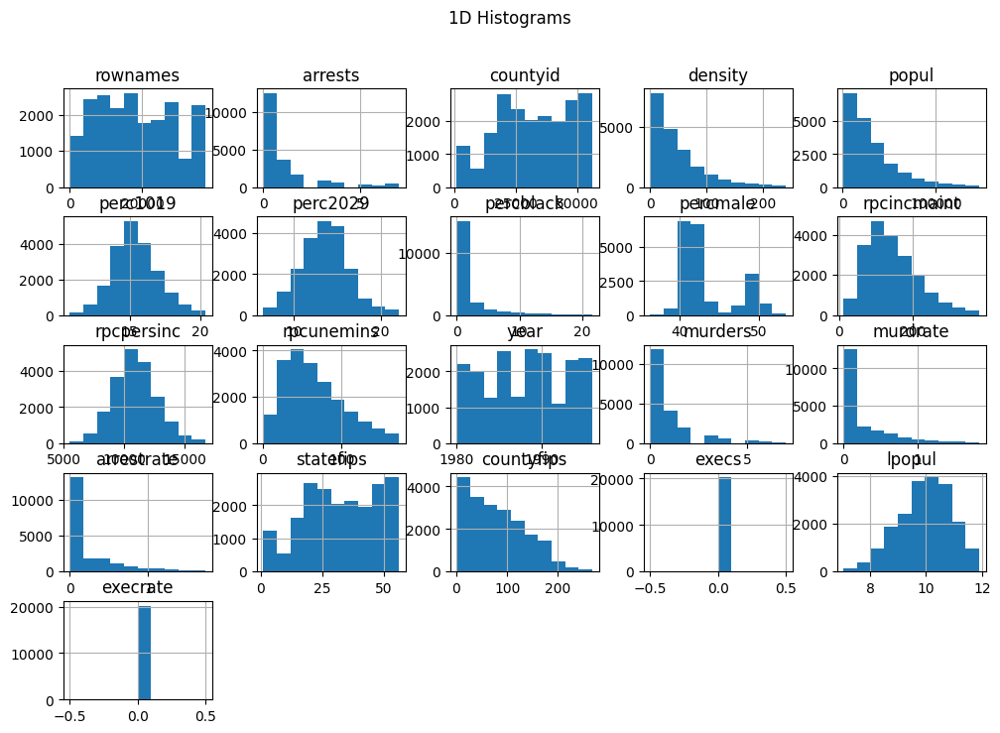

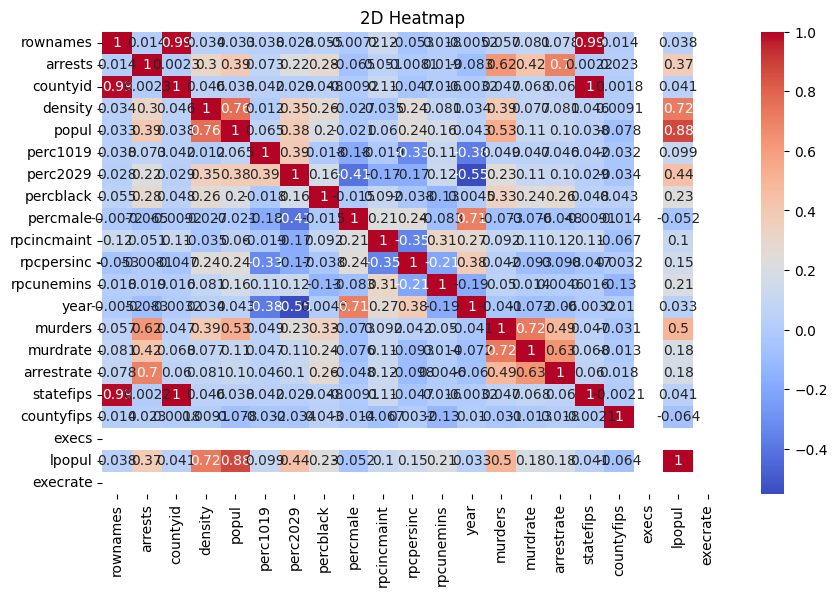

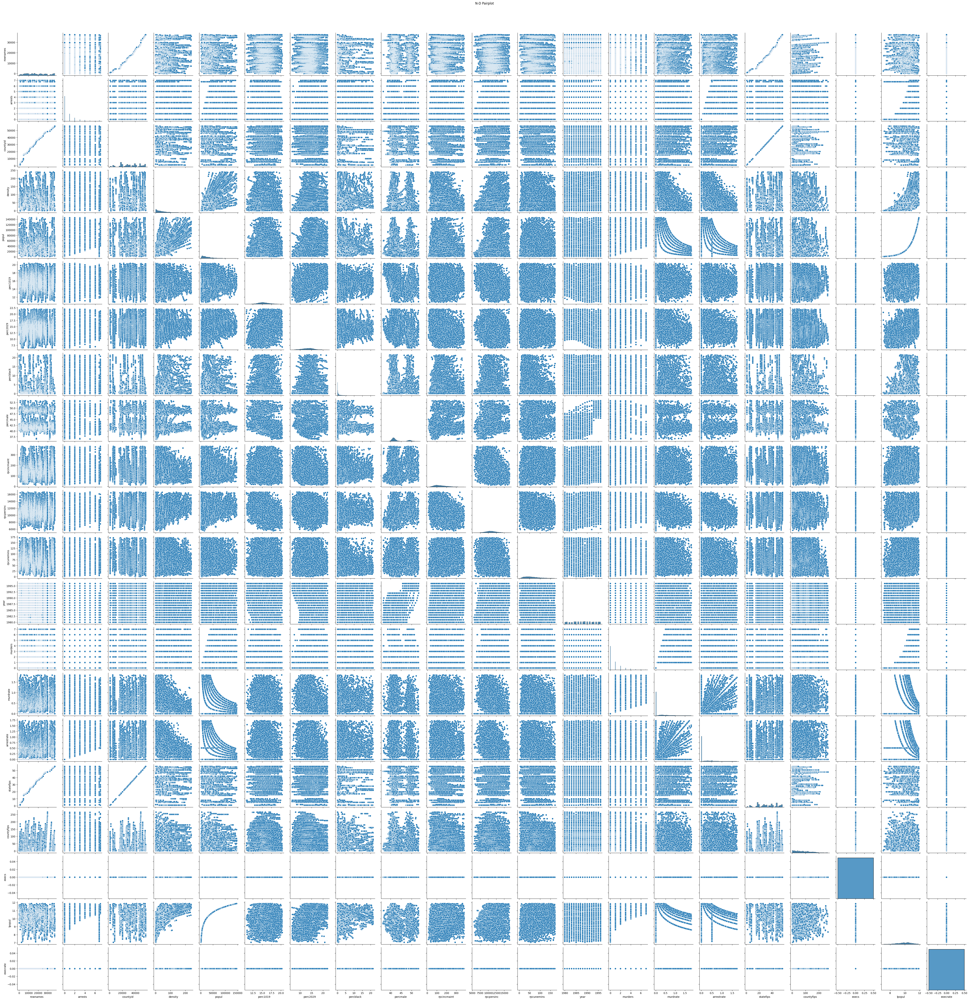

In [ ]:
# 1D: Histogram
df.hist(figsize=(12, 8))
plt.suptitle("1D Histograms")
plt.show()

# 2D: Correlation Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title("2D Heatmap")
plt.show()

# N-D: Pairplot
sns.pairplot(df)
plt.suptitle("N-D Pairplot", y=1.02)
plt.show()


# **Step 5: Time-Series Analysis**

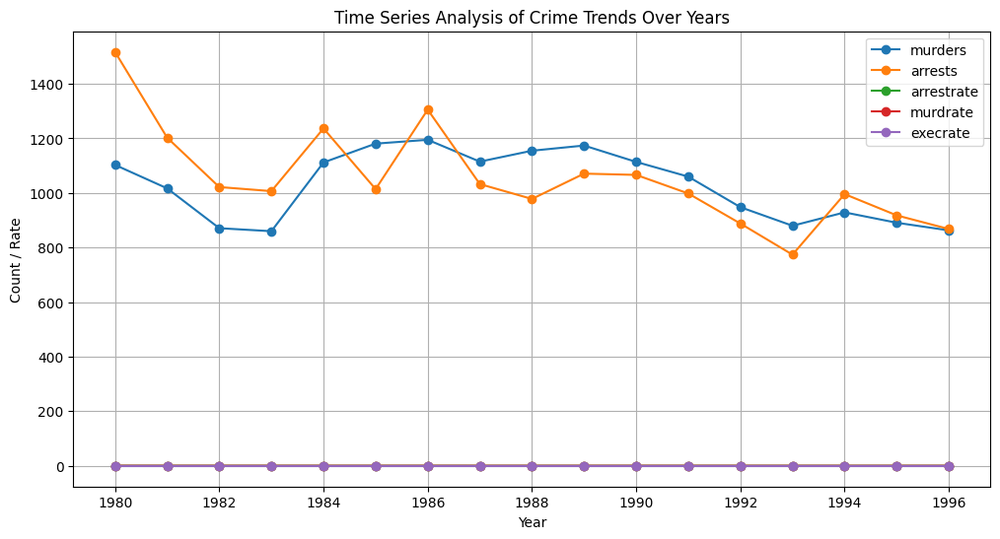

In [ ]:
# Group data by 'year' and calculate the sum or mean of relevant metrics
yearly_data = df.groupby('year').agg({
    'murders': 'sum',
    'arrests': 'sum',
    'arrestrate': 'mean',
    'murdrate': 'mean',
    'execrate': 'mean'
})

# Plot time series trends
plt.figure(figsize=(12, 6))
for col in yearly_data.columns:
    plt.plot(yearly_data.index, yearly_data[col], marker='o', label=col)

plt.title("Time Series Analysis of Crime Trends Over Years")
plt.xlabel("Year")
plt.ylabel("Count / Rate")
plt.legend()
plt.grid(True)
plt.show()


# **Step 6: Dimensionality Reduction (PCA)**

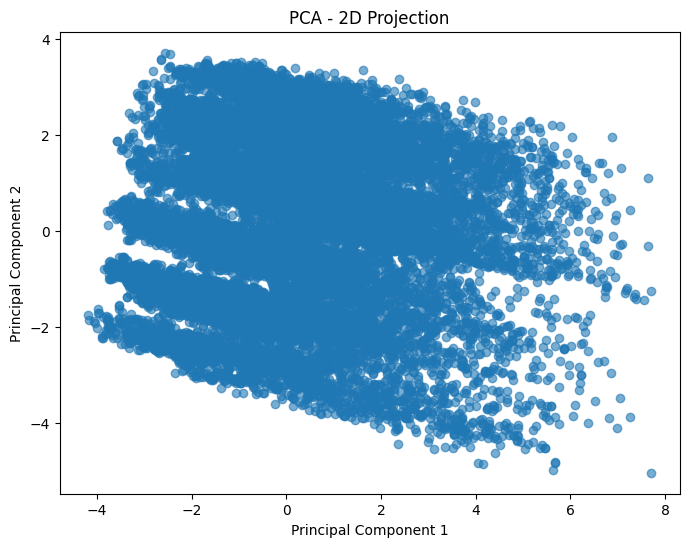

In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

# PCA Visualization
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.6)
plt.title("PCA - 2D Projection")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()


# **Step 7: Model Building**

In [ ]:
# Create a binary target: high murder rate (above median)
df['high_murder_rate'] = (df['murdrate'] > df['murdrate'].median()).astype(int)

# Drop columns not useful for modeling
drop_cols = ['rownames', 'murdrate', 'statefips', 'countyfips']  # also dropping the original murdrate
X = df.drop(columns=drop_cols + ['high_murder_rate'])
y = df['high_murder_rate']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train a Random Forest with reduced complexity
model = RandomForestClassifier(n_estimators=50, max_depth=10, random_state=42)
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)


# **Step 8: Model Evaluation**

In [ ]:
# Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2354
           1       1.00      1.00      1.00      1688

    accuracy                           1.00      4042
   macro avg       1.00      1.00      1.00      4042
weighted avg       1.00      1.00      1.00      4042

